In [1]:
import scanpy as sc
import anndata as ann
import numpy as np
import scipy as sp
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import cm, colors
#from gprofiler import gprofiler

import os

# Define the path to the directory you want to change to
new_directory = '/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/MM_sysVI'

# Use os.chdir() to change the working directory
os.chdir(new_directory)

#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [2]:
plt.rcParams['figure.figsize']=(5,5) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=True, fontsize=14) #color_map=mymap2)
sc.settings.figdir = '/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/MM_sysVI/figures/'
sc.logging.print_header()

scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.26.4 scipy==1.11.4 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.12


In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

# Remake OL figures!!!

In [4]:
adata = sc.read_h5ad('/scratch365/eaboelno/BACKUP_h5ad_IMPORTANT/adata_mm_OL_NEW.h5ad')
adata

AnnData object with n_obs × n_vars = 44794 × 19913
    obs: 'sample_id', 'publication', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'type_fine', 'type_broad', 'indiv_treatment_time', 'lesion_status', 'lesion_condition', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'S_score', 'G2M_score', 'Cycling cells', 'S phase', 'Cycling_cells', 'S_phase_cells', 'leiden_OL_r1.5', 'individual_lesion_condition', 'OL_broad', 'OL_broad_MOLs', 'OL_leiden_annotated_new', 'minimal_treatment_map', 'OL_fine_type', 'OL_leiden_annotated', 'cell_type', 'OL_fine_type_NEW', 'OL_noDAO_NEW', 'OL_noDAO_NEW_NUMBERED', 'OL_noDAO_NUMBERED', 'OL_noDAO_LETTER'
    var: 'hb', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'OL_broad_MOLs_colors', 'OL_broad_MOLs_sizes', 'OL_broad_colors', 'OL_broad_sizes', 'O

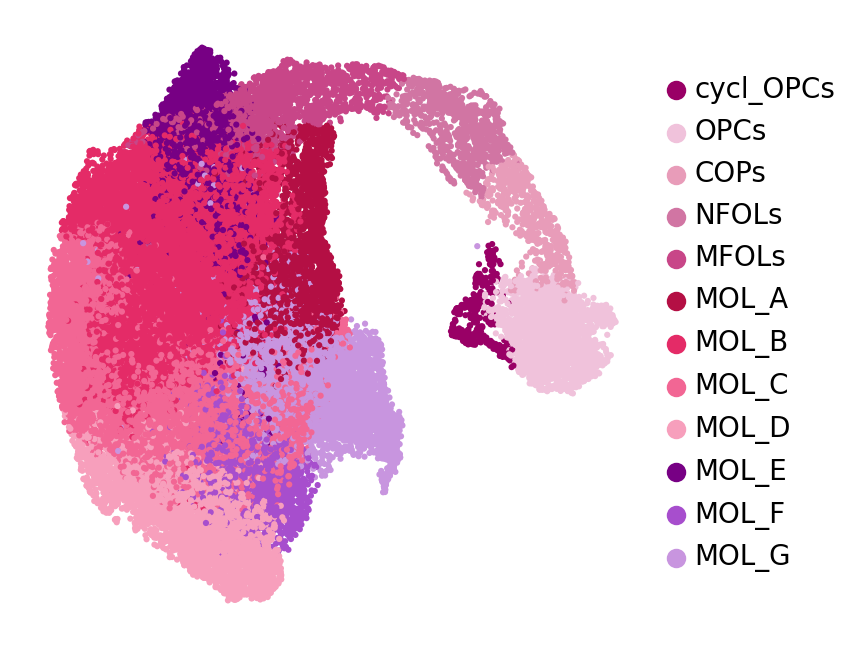

In [8]:
cluster_color = {
    'MOL_A': '#b40f44',
    'MOL_B': '#e42b67',
    'MOL_C': '#f26694',
    'MOL_E': '#770084',
    'MOL_G': '#c895df',
    'MOL_D': '#f79fbc',
    'MFOLs': '#c84688',
    'OPCs': '#f0c2db',
    'MOL_F': '#a74ecd',
    'NFOLs': '#d175a3',
    'COPs': '#e89cb9',
    'cycl_OPCs': '#990066'
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['OL_noDAO_NEW'], legend_fontsize =float(10) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color,s=20,
           legend_fontweight= 'bold', title='', frameon= False , 
           legend_fontoutline=1)

In [5]:
cupr_genes = ['Syt4', 'Nupr1', 'Tenm4', 'Trib3', 'Moxd1', 'Gdf15', 'Slc7a5', 'Cyb5r2', 'Sox2',
              'Dnal4', 'Smpd3', 'Ddit3', 'Atf4', 'Eda2r', 'Cox20', 'Cebpg', 'Cdh6',
              'Chchd10', 'Frmd4a', 'Cd44', 'Vegfa', 'Xylt1', 'Ptch1', 'Smn1']

sc.tl.score_genes(adata, cupr_genes, score_name='Cupr_signature')

computing score 'Cupr_signature'
    finished: added
    'Cupr_signature', score of gene set (adata.obs).
    498 total control genes are used. (0:00:01)


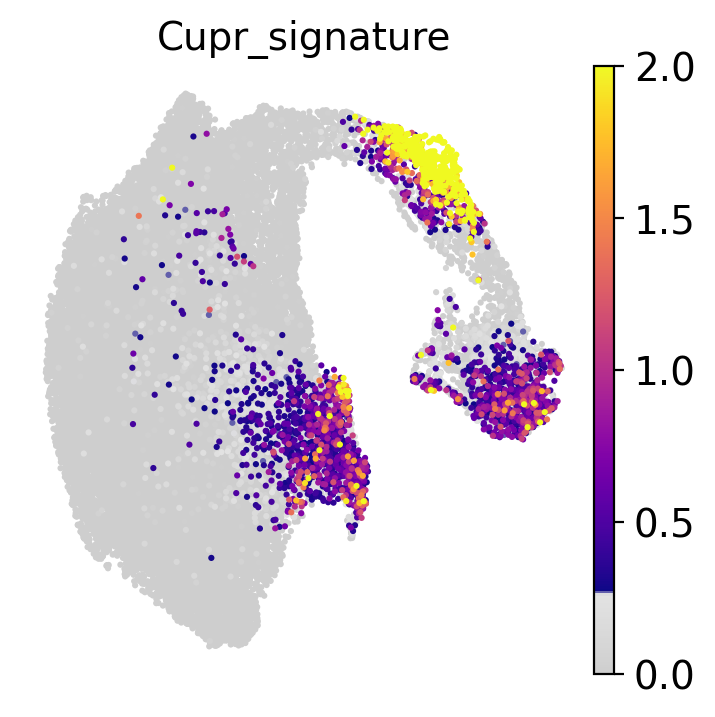

In [15]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['Cupr_signature'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20,
           save='_mm_Cupr_DA_sig.png')

In [7]:
lpc_genes = ['Klk8', 'Bcan', 'Steap3', 'Sox5', 'Nrcam', 'Plvap', 'Chl1', 'Nav3',  
            'Fgfrl1', 'Sema4f', 'Tspan4', 'Amotl1', 'Ifit1', 'Oasl2', 'Piezo2', 'Anxa2',  
            'Socs3', 'Gbp3', 'Mmd2', 'Usp18', 'Npb', 'Fam124a', 'Ddx60', 'Bcl3',  
            'Ralgps2', 'Pdzrn4', 'Apba2', 'Ifi27l2a', 'C4b', 'Nnat', 'Snx10', 'Rasip1',  
            'Cachd1', 'Masp1', 'Parp3', 'Kcnip1', 'Pros1']

sc.tl.score_genes(adata, lpc_genes, score_name='LPC_signature')

computing score 'LPC_signature'
    finished: added
    'LPC_signature', score of gene set (adata.obs).
    595 total control genes are used. (0:00:10)


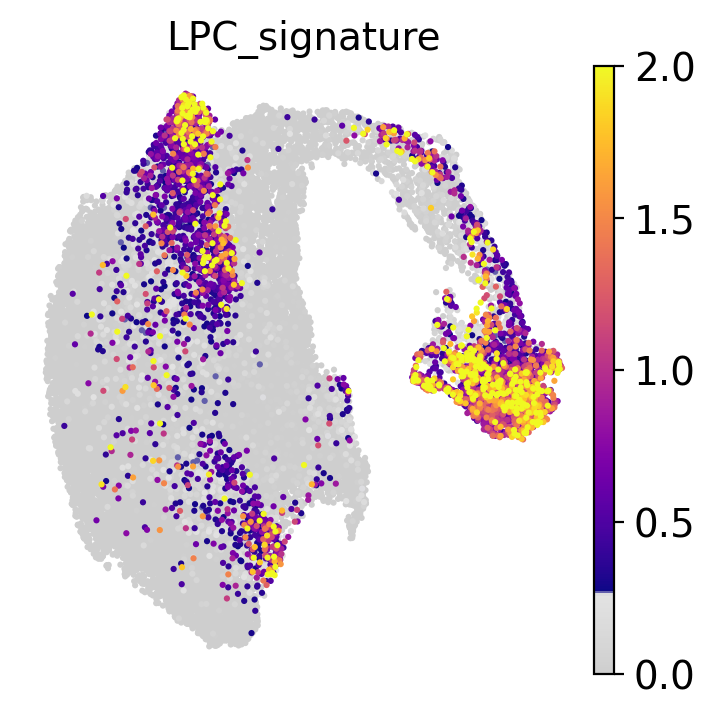

In [16]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['LPC_signature'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20,
           save='_mm_LPC_DA_sig.png')

In [12]:
lpc_both_genes = ['Klk8', 'Steap3', 'Nrcam', 'Nav3',  
            'Fgfrl1', 'Tspan4', 'Amotl1', 'Oasl2', 'Piezo2', 'Anxa2',  
            'Socs3', 'Mmd2', 'Usp18', 'Npb', 'Ddx60', 'Bcl3',  
            'Apba2', 'Ifi27l2a', 'C4b', 'Nnat', 'Snx10',  
            'Cachd1', 'Masp1', 'Parp3', 'Pros1']

sc.tl.score_genes(adata, lpc_both_genes, score_name='LPC_both_signature')

computing score 'LPC_both_signature'
    finished: added
    'LPC_both_signature', score of gene set (adata.obs).
    498 total control genes are used. (0:00:03)


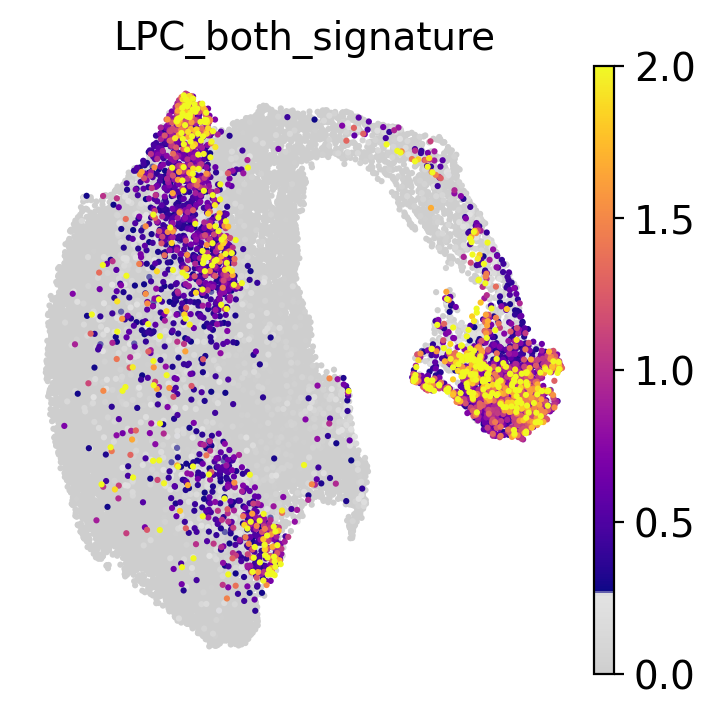

In [13]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['LPC_both_signature'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20)
          #save=today+'_Pandey_DA_sig.png')

## Start code

In [5]:
cluster2annotation = {
    'MOL_A': 'MOL_A',
    'MOL_B': 'MOL_B',
    'MOL_C': 'MOL_C',
    'MOL_E': 'MOL_E',
    'MOL_G': 'MOL_G',
    'MOL_D': 'MOL_D',
    'MFOLs': 'MFOLs',
    'OPCs': 'OPCs',
    'MOL_F': 'MOL_F',
    'NFOLs': 'NFOLs',
    'COPs': 'COPs',
    'cycl_OPCs': 'cycling'
}

adata.obs['OL_noDAO_NEW'] = adata.obs['OL_noDAO_NEW'].map(cluster2annotation).astype('category')

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


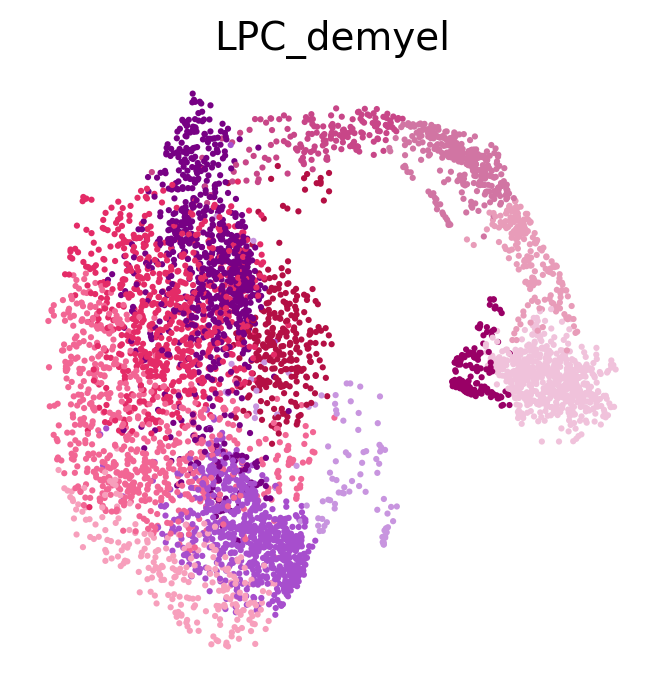

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


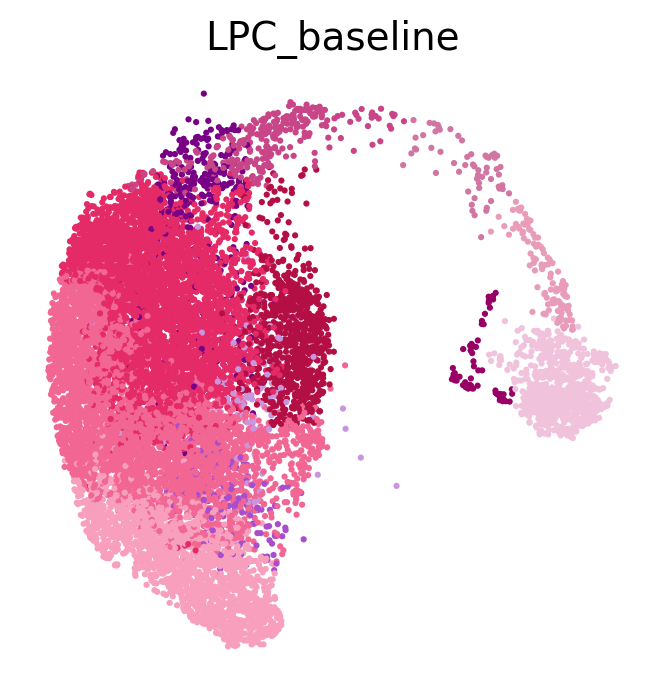

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


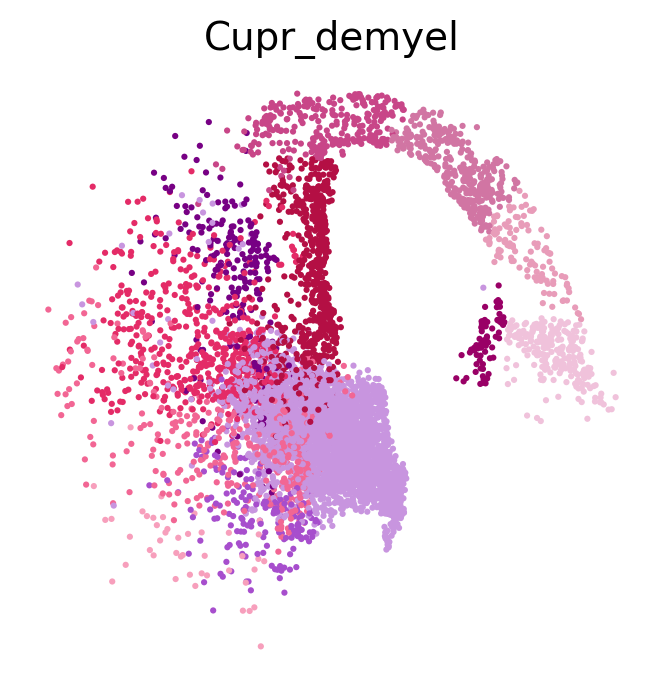

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


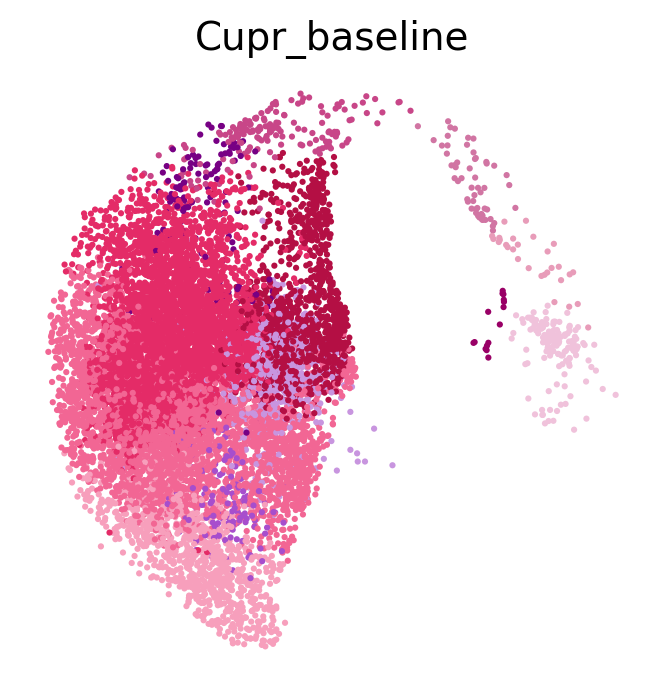

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


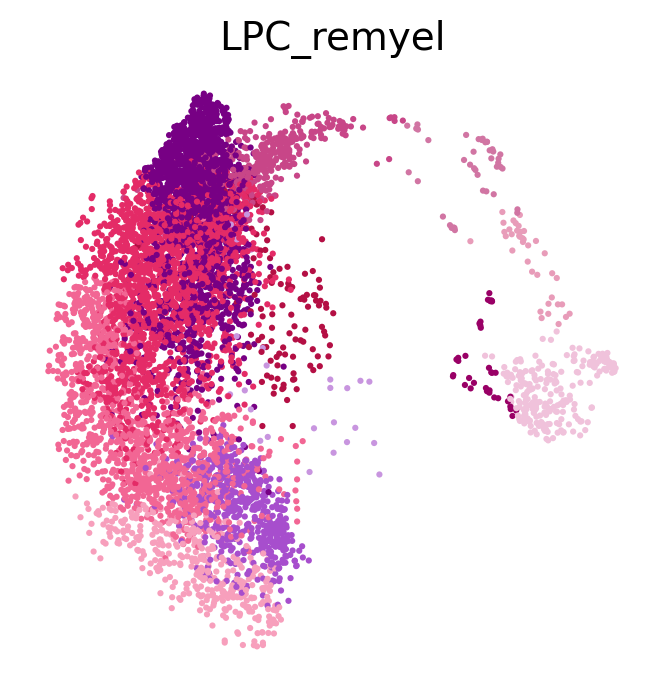

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


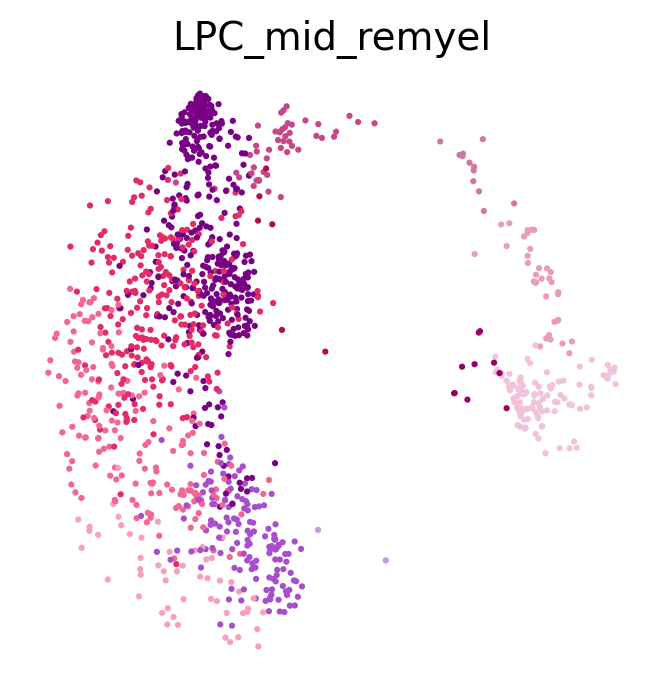

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


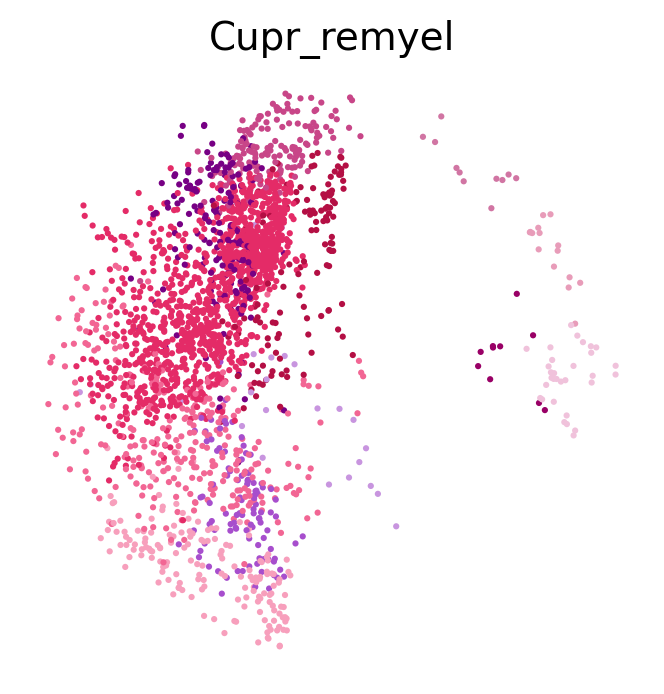

In [7]:
# Plot each dataset separately
for publication in adata.obs['lesion_status'].unique():
    subset_data = adata[adata.obs['lesion_status'] == publication, :]
    filename = f"{publication}_mm_broad_cell_types_by_lesion_status"  # Unique filename for each plot
    sc.pl.umap(
        subset_data,
        color=["OL_noDAO_NEW"],
        cmap=mymap2,
        palette=cluster_color,  # Use the predefined color mapping
        title=publication,
        frameon=False,
        legend_loc=None,
        ncols=1,
        s=20,
        save=filename,  # Save with the unique filename
    )

# BAR CHARTS

In [7]:
status_updated = {
    'LPC_demyelination_7d': 'LPC_demyel',
    'LPC_saline': 'LPC_baseline',
    'Cuprizone_demyelination_5w': 'Cupr_demyel',
    'Cuprizone_baseline_adams': 'Cupr_baseline',
    'LPC_demyelination_5d': 'LPC_demyel',
    'LPC_remyelination_28d': 'LPC_remyel',
    'LPC_no_lesion': 'LPC_baseline',
    'LPC_demyelination_14d': 'LPC_mid_remyel',
    'Cuprizone_remyelination_4+3w': 'Cupr_remyel',
    'Cuprizone_demyelination_4w': 'Cupr_demyel',
    'Cuprizone_baseline': 'Cupr_baseline'
}

adata.obs['lesion_status'] = adata.obs['lesion_status'].map(status_updated)

In [30]:
# Group by 'treatment_meta' and 'cell_type_eval' to count cells
cell_type_counts = adata.obs.groupby(['lesion_status', 'OL_noDAO_NEW']).size().reset_index(name='cell_count')

# Pivot the DataFrame to have treatments as index and cell types as columns
pivoted_counts = cell_type_counts.pivot(index='OL_noDAO_NEW', columns='lesion_status', values='cell_count').fillna(0)

#Add totals
total_cells = pivoted_counts.sum()

#Add percent
percent_counts = pivoted_counts.div(total_cells) * 100
percent_counts_transposed = percent_counts.transpose()
percent_counts_transposed

/tmp/1033667.1.gpu/ipykernel_2002325/814406305.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell_type_counts = adata.obs.groupby(['lesion_status', 'OL_noDAO_NEW']).size().reset_index(name='cell_count')


OL_noDAO_NEW,cycling,OPCs,COPs,NFOLs,MFOLs,MOL_A,MOL_B,MOL_C,MOL_D,MOL_E,MOL_F,MOL_G
lesion_status,,,,,,,,,,,,
Cupr_baseline,0.140542,1.274243,0.271714,0.515319,1.592804,9.969081,37.955589,30.947250,8.816640,1.377307,1.311721,5.827790
Cupr_demyel,1.249605,3.859538,1.819045,5.362227,4.476432,10.376463,8.383423,6.944005,0.695982,3.543183,2.894654,50.395444
Cupr_remyel,0.415455,1.287910,0.623182,0.457000,7.021188,5.608641,52.721230,12.505193,7.021188,7.062734,4.237640,1.038637
LPC_baseline,0.551187,5.965794,0.891627,0.486342,2.285807,6.776364,31.352841,31.320418,14.671314,3.347653,1.418497,0.932155
LPC_demyel,2.997165,12.393682,4.029972,6.358850,3.422438,5.832321,14.034022,13.426488,4.961523,16.788173,13.953017,1.802349
LPC_mid_remyel,0.794913,8.505564,2.782194,0.953895,4.054054,0.476948,19.316375,13.513514,4.133545,33.545310,11.764706,0.158983
LPC_remyel,0.539437,3.455314,0.554017,0.612334,5.569325,1.574574,28.400641,16.620499,5.904651,28.123633,8.222773,0.422802


In [34]:
# Define the desired order of treatments and cell types
desired_treatments_order = ['LPC_baseline', 'LPC_demyel', 'LPC_mid_remyel', 'LPC_remyel',
                            'Cupr_baseline', 'Cupr_demyel', 'Cupr_remyel']
    
desired_cell_types_order = ['cycling', 'OPCs', 'COPs', 'NFOLs', 'MFOLs', 'MOL_A', 'MOL_B',
                           'MOL_C', 'MOL_D', 'MOL_E', 'MOL_F', 'MOL_G']

# Reorder the columns and the index of the percent_counts DataFrame
percent_counts_reordered = percent_counts_transposed[desired_cell_types_order].reindex(desired_treatments_order)

# Sum the counts of the specified cell types to create the 'other' category
percent_counts_reordered['progenitors'] = percent_counts_reordered[['cycling', 'OPCs', 'COPs', 'NFOLs', 'MFOLs']].sum(axis=1)

# Remove the individual cell type columns from the DataFrame
percent_counts_reordered.drop(columns=['cycling', 'OPCs', 'COPs', 'NFOLs', 'MFOLs'], inplace=True)

# Remove the specific row from the DataFrame
percent_counts_reordered.drop(index='LPC_mid_remyel', inplace=True)

#Rename index
percent_counts_reordered.rename(index={'LPC_mid_remyel': 'LPC_mid_remyel'}, inplace=True)

# Reorder the columns of the DataFrame with the 'other' category included
desired_cell_types_order_updated = ['progenitors', 'MOL_A', 'MOL_B',
                        'MOL_C', 'MOL_D', 'MOL_E', 'MOL_F', 'MOL_G']
percent_counts_reordered = percent_counts_reordered[desired_cell_types_order_updated]

percent_counts_reordered

OL_noDAO_NEW,progenitors,MOL_A,MOL_B,MOL_C,MOL_D,MOL_E,MOL_F,MOL_G
lesion_status,,,,,,,,
LPC_baseline,10.180757,6.776364,31.352841,31.320418,14.671314,3.347653,1.418497,0.932155
LPC_demyel,29.202106,5.832321,14.034022,13.426488,4.961523,16.788173,13.953017,1.802349
LPC_remyel,10.730427,1.574574,28.400641,16.620499,5.904651,28.123633,8.222773,0.422802
Cupr_baseline,3.794622,9.969081,37.955589,30.947250,8.816640,1.377307,1.311721,5.827790
Cupr_demyel,16.766846,10.376463,8.383423,6.944005,0.695982,3.543183,2.894654,50.395444
Cupr_remyel,9.804736,5.608641,52.721230,12.505193,7.021188,7.062734,4.237640,1.038637


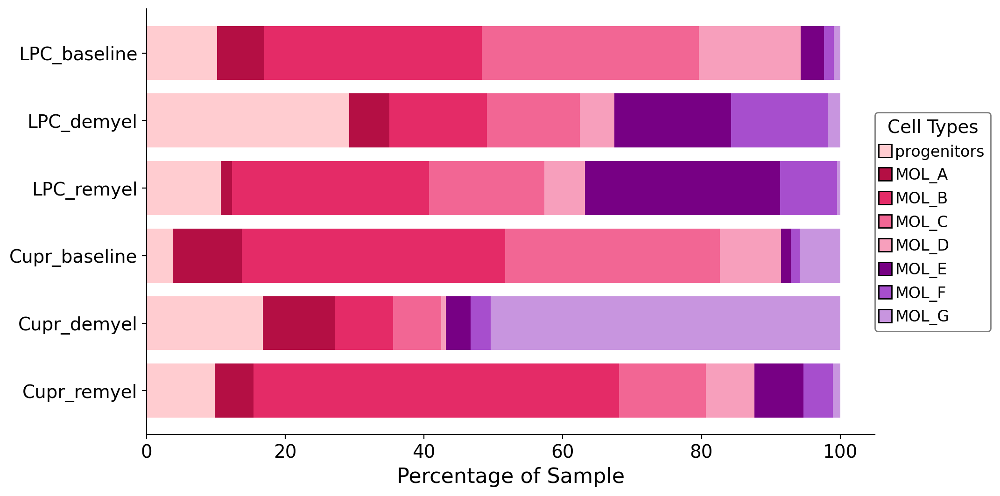

In [37]:
# Define the custom color map for the updated cell types, including 'Other'
custom_colors = {
    'MOL_A': '#b40f44',
    'MOL_B': '#e42b67',
    'MOL_C': '#f26694',
    'MOL_E': '#770084',
    'MOL_G': '#c895df',
    'MOL_D': '#f79fbc',
    'MOL_F': '#a74ecd',
    'progenitors': '#ffccd0'
}


# Define the colors for the stacked bar chart in the order of desired_cell_types_order_updated
colors = [custom_colors[cell_type] for cell_type in desired_cell_types_order_updated]

# Plot the horizontal stacked bar chart with custom colors
ax = percent_counts_reordered.plot(kind='barh', stacked=True, figsize=(10, 6), color=colors, width=0.8)

# Set the title and labels with increased font size
ax.set_xlabel('Percentage of Sample', fontsize=16)  # Increase font size

# Remove y-axis label
ax.set_ylabel('')  # Empty string to remove label

# Increase font size of ticks
plt.xticks(fontsize=14)  # Increase font size
plt.yticks(fontsize=14)  # Increase font size

# Invert the y-axis to reverse the order
ax.invert_yaxis()

# Remove grid lines
ax.grid(False)

# Remove border
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

# Show only x and y axis lines
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')


# Create legend with transparency
legend_handles = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor=custom_colors[col], markersize=10, markeredgecolor='black') for col in percent_counts_reordered.columns]
#legend = ax.legend(legend_handles, percent_counts_reordered.columns, loc='lower left', fontsize=12, title='Cell Types')
legend = ax.legend(legend_handles, percent_counts_reordered.columns, loc='center left', fontsize=12, title='Cell Types', bbox_to_anchor=(1, 0.5), borderaxespad=0.)

# Set transparency of the legend
legend.get_frame().set_alpha(0.5)  # Set alpha value for transparency (0.5 makes it semi-transparent)

# Optionally, add a border color for contrast
legend.get_frame().set_edgecolor('black')  # Set border color of the legend

# Save the plot as a PNG file
plt.savefig('./figures/MM_OL_cell_types_stacked_barh_NEW4.png', bbox_inches='tight', dpi=300)

# Show the plot
plt.show()

In [12]:
numbered_cluster = {
    'MOL_A': '6_MOL_A',
    'MOL_B': '7_MOL_B',
    'MOL_C': '8_MOL_C',
    'MOL_E': '10_MOL_E',
    'MOL_G': '12_MOL_G',
    'MOL_D': '9_MOL_D',
    'MFOLs': '5_MFOLs',
    'OPCs': '2_OPCs',
    'MOL_F': '11_MOL_F',
    'NFOLs': '4_NFOLs',
    'COPs': '3_COPs',
    'cycl_OPCs': '1_cycl_OPCs'
}

adata.obs['OL_noDAO_NEW_NUMBERED'] = adata.obs['OL_noDAO_NEW'].map(numbered_cluster).astype('category')

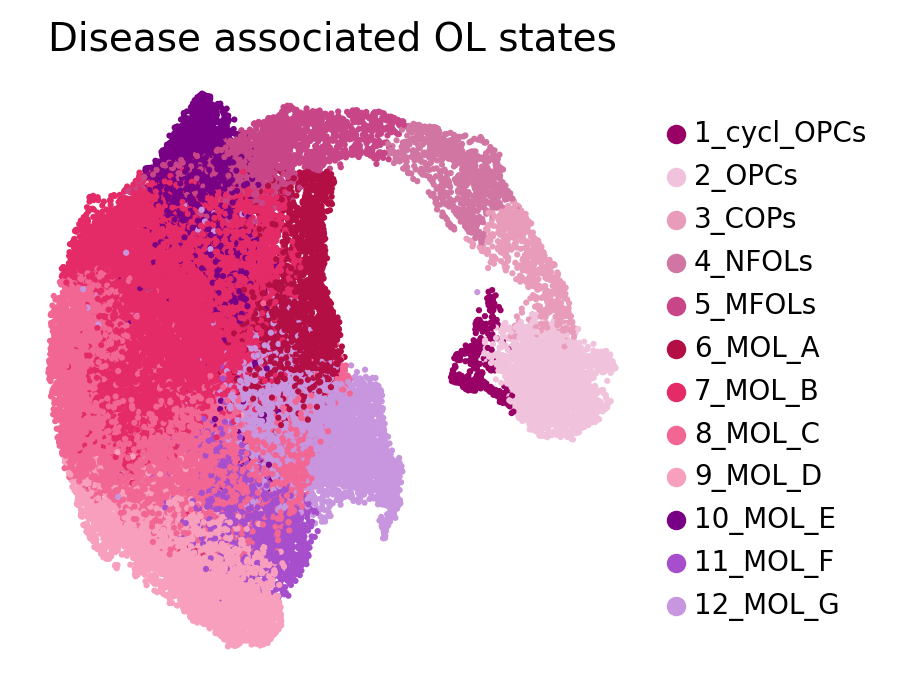

In [31]:
cluster_color = {
    '6_MOL_A': '#b40f44',
    '7_MOL_B': '#e42b67',
    '8_MOL_C': '#f26694',
    '10_MOL_E': '#770084',
    '12_MOL_G': '#c895df',
    '9_MOL_D': '#f79fbc',
    '5_MFOLs': '#c84688',
    '2_OPCs': '#f0c2db',
    '11_MOL_F': '#a74ecd',
    '4_NFOLs': '#d175a3',
    '3_COPs': '#e89cb9',
    '1_cycl_OPCs': '#990066'
}

# Define the order of cell types
cell_type_order = ['1_cycl_OPCs', '2_OPCs', '3_COPs', '4_NFOLs', '5_MFOLs', '6_MOL_A', '7_MOL_B',
                        '8_MOL_C', '9_MOL_D', '10_MOL_E', '11_MOL_F', '12_MOL_G']

# Reorder the cell types
adata.obs['OL_noDAO_NEW_NUMBERED'] = pd.Categorical(adata.obs['OL_noDAO_NEW_NUMBERED'], 
                                                     categories=cell_type_order, ordered=True)

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['OL_noDAO_NEW_NUMBERED'], legend_fontsize =float(10) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color,s=20,
           legend_fontweight= 'bold', title='Disease associated OL states', frameon= False , 
           legend_fontoutline=1, save=today+'_annotated_OL_fine_NEW_NUMBERED.png')

In [10]:
numbered_cluster = {
    'MOL_A': 'A',
    'MOL_B': 'B',
    'MOL_C': 'C',
    'MOL_E': 'E',
    'MOL_G': 'G',
    'MOL_D': 'D',
    'MFOLs': 'MFOLs',
    'OPCs': 'OPCs',
    'MOL_F': 'F',
    'NFOLs': 'NFOLs',
    'COPs': 'COPs',
    'cycl_OPCs': 'cycl'
}

adata.obs['OL_noDAO_LETTER'] = adata.obs['OL_noDAO_NEW'].map(numbered_cluster).astype('category')

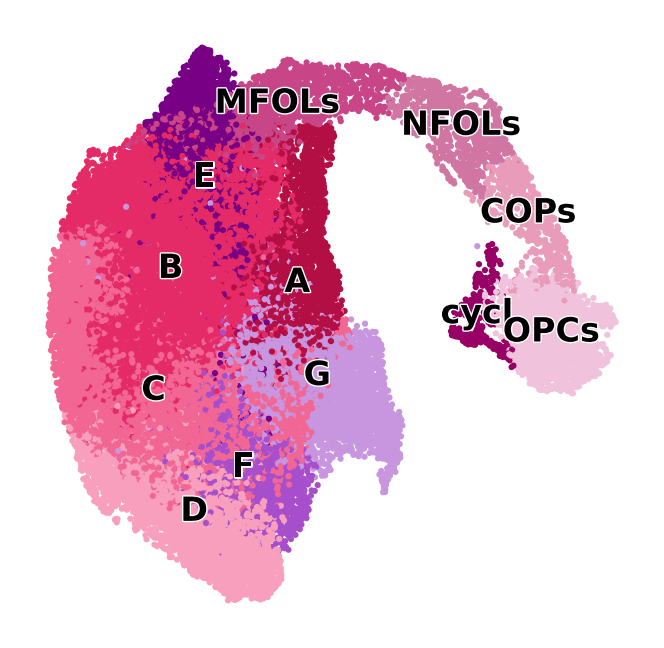

In [12]:
cluster_color = {
    'A': '#b40f44',
    'B': '#e42b67',
    'C': '#f26694',
    'E': '#770084',
    'G': '#c895df',
    'D': '#f79fbc',
    'MFOLs': '#c84688',
    'OPCs': '#f0c2db',
    'F': '#a74ecd',
    'NFOLs': '#d175a3',
    'COPs': '#e89cb9',
    'cycl': '#990066'
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['OL_noDAO_LETTER'], legend_fontsize =float(12) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color,s=20, legend_loc= 'on data',
           legend_fontweight= 'bold', title='', frameon= False , 
           legend_fontoutline=1, save=today+'_annotated_OL_fine_LETTERED.png')

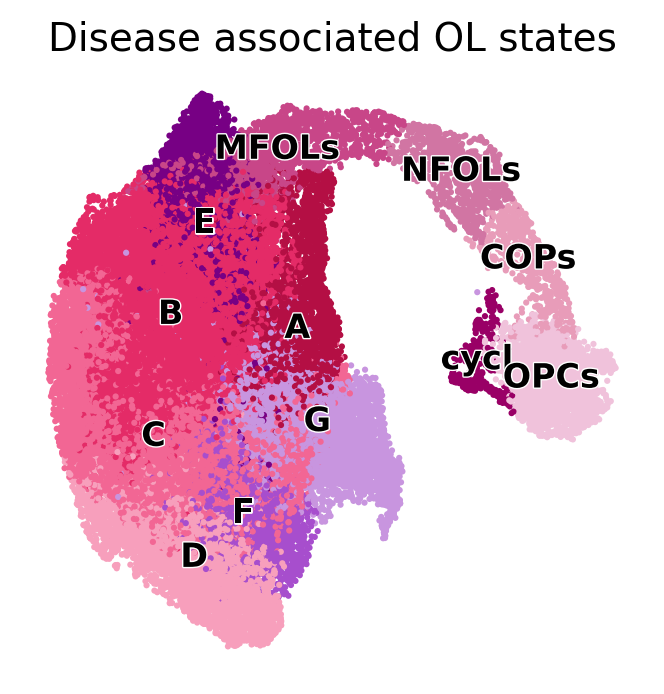

In [11]:
cluster_color = {
    'A': '#b40f44',
    'B': '#e42b67',
    'C': '#f26694',
    'E': '#770084',
    'G': '#c895df',
    'D': '#f79fbc',
    'MFOLs': '#c84688',
    'OPCs': '#f0c2db',
    'F': '#a74ecd',
    'NFOLs': '#d175a3',
    'COPs': '#e89cb9',
    'cycl': '#990066'
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['OL_noDAO_LETTER'], legend_fontsize =float(12) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color,s=20, legend_loc= 'on data',
           legend_fontweight= 'bold', title='Disease associated OL states', frameon= False , 
           legend_fontoutline=1, save=today+'_annotated_OL_fine_LETTERED.png')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


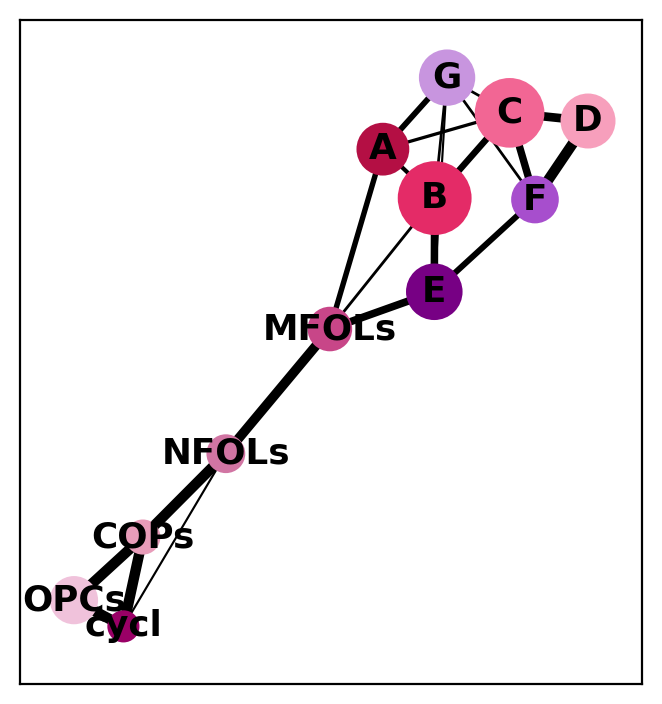

In [7]:
sc.tl.paga(adata, groups='OL_noDAO_LETTER', use_rna_velocity=False, model='v1.2', neighbors_key=None, copy=False)
sc.pl.paga(adata,threshold=0.2,node_size_scale=2, edge_width_scale=0.5)

--> added 'pos', the PAGA positions (adata.uns['paga'])


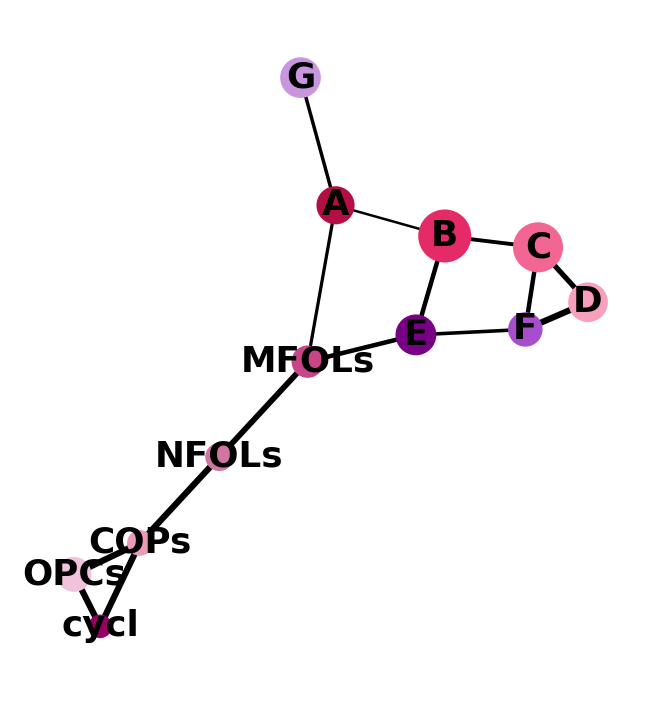

In [8]:
sc.pl.paga(adata,threshold=0.4,node_size_scale=1, edge_width_scale=0.3, frameon=False)

--> added 'pos', the PAGA positions (adata.uns['paga'])


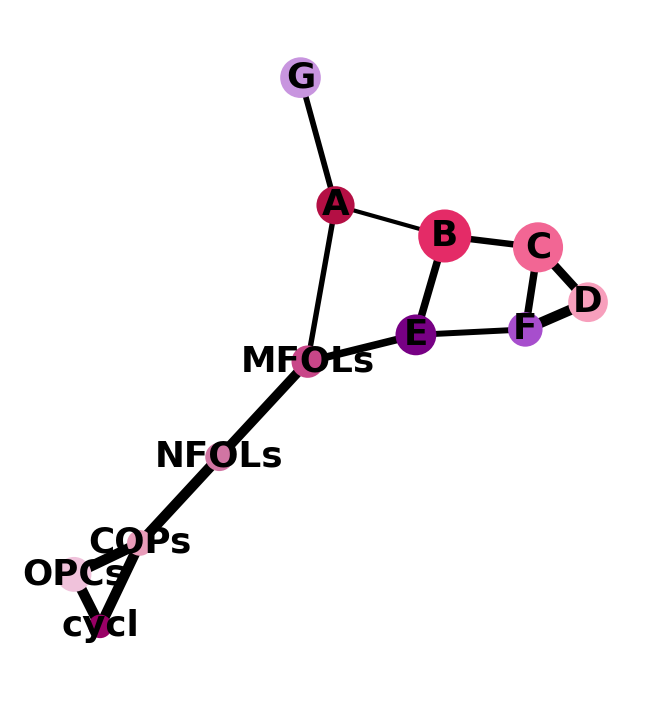

In [9]:
sc.pl.paga(adata,threshold=0.4,node_size_scale=1, edge_width_scale=0.5, frameon=False)

--> added 'pos', the PAGA positions (adata.uns['paga'])


/tmp/1027869.1.gpu/ipykernel_1891713/3143269325.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pos = pos.groupby("group").mean()


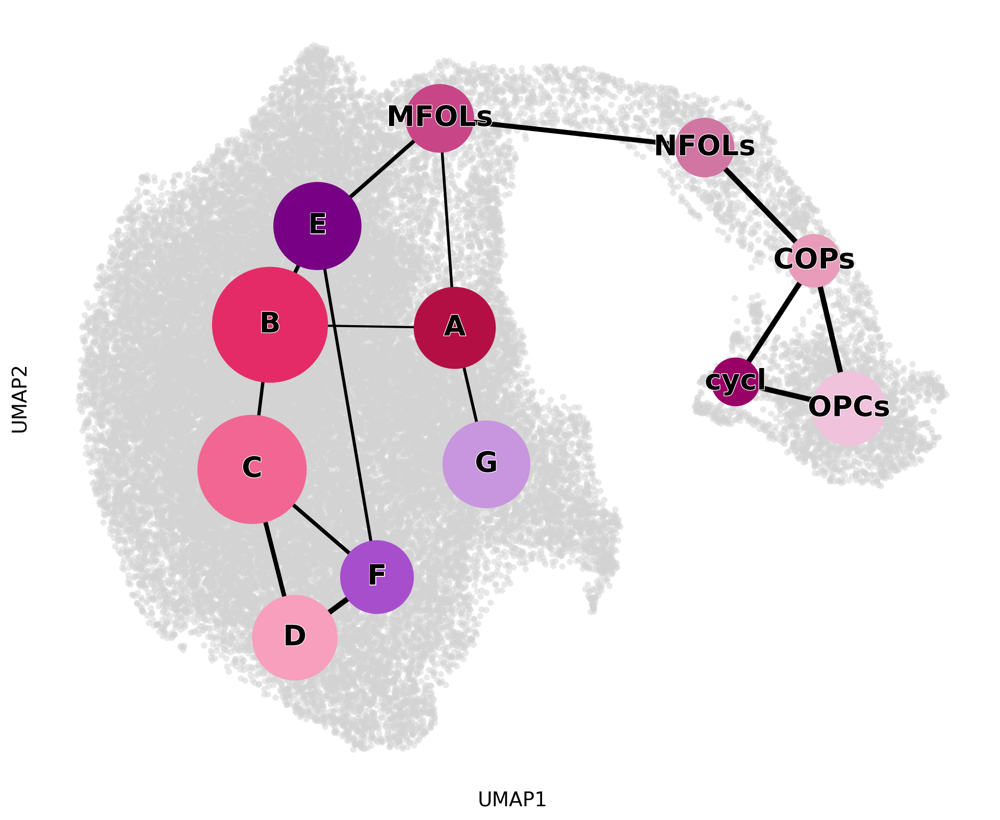

In [14]:
# Define threshold
thr = 0.4

# Define PAGA positions based on the UMAP layout -
# for each cluster we use the mean of the UMAP positions from the cells in that cluster
pos = pd.DataFrame(adata.obsm["X_umap"], index=adata.obs_names)
pos["group"] = adata.obs[adata.uns["paga"]["groups"]]
pos = pos.groupby("group").mean()

# Adjust the figure size
fig, ax = plt.subplots(figsize=(12, 10))  # Increase the figure size

# Plot UMAP in the background on the same ax
sc.pl.umap(adata, ax=ax, show=False, size=80, alpha=0.5)

# Plot PAGA on top of the UMAP on the same ax
sc.pl.paga(
    adata,
    color="OL_noDAO_LETTER",
    threshold=thr,
    node_size_scale=20,
    edge_width_scale=0.5,
    pos=pos.values,
    random_state=0,
    ax=ax,
    fontoutline=1,
    frameon=False,
    fontsize=20,  # Adjust the fontsize for the node labels
    save='PAGA_MOL_DAO_LARGE_NEW.png'
)

# Show the plot
plt.show()

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Pa

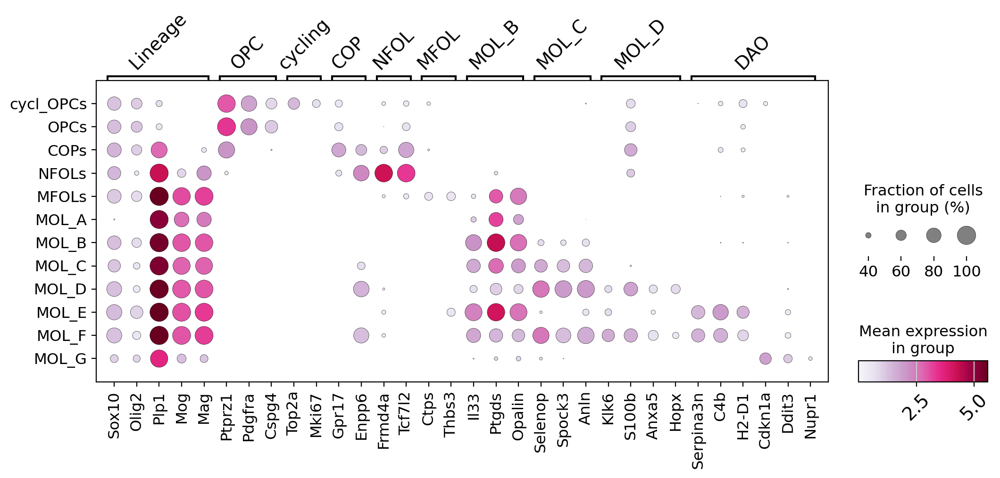

In [8]:
marker_genes = {
    'Lineage': ['Sox10', 'Olig2', 'Plp1', 'Mog', 'Mag'],
    'OPC': ['Ptprz1', 'Pdgfra', 'Cspg4'],
    'cycling': ['Top2a', 'Mki67'],
    'COP': ['Gpr17', 'Enpp6',],
    'NFOL': ['Frmd4a', 'Tcf7l2'],
    'MFOL': ['Ctps', 'Thbs3'],
    'MOL_B': ['Il33', 'Ptgds', 'Opalin'],
    'MOL_C': ['Selenop', 'Spock3', 'Anln'],
    'MOL_D': ['Klk6', 'S100b', 'Anxa5', 'Hopx'],
    'DAO': ['Serpina3n', 'C4b', 'H2-D1', 'Cdkn1a', 'Ddit3', 'Nupr1'],
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes.values() for gene in genes]

# Correct var_group_positions based on marker_genes
var_group_positions = []
start = 0
for genes in marker_genes.values():
    end = start + len(genes) - 1  # Calculate the end index for the group
    var_group_positions.append((start, end))  # Add the start and end index to var_group_positions
    start = end + 1  # Update the start index for the next group

# Plot the dotplot with the corrected parameters
ax = sc.pl.dotplot(
        adata,
        groupby="OL_noDAO_NEW",
        var_names=all_genes,
        use_raw=False,
        log=False,
        dendrogram=False,
        layer='log1p_norm',
        var_group_positions=var_group_positions,
        var_group_labels=list(marker_genes.keys()),
        var_group_rotation=45,
        swap_axes=False,  # Keep genes on the x-axis and cell types on the y-axis
        cmap='PuRd',  # Choose a color map for dot intensities
        color_map='PuRd',  # Choose a color map for dot colors
        figsize=(10, 8),  # Set the figure size
        show=False,
        dot_min=0.25,  # Adjust the minimum dot size
        dot_max=1,  # Adjust the maximum dot size
        #mean_only_expressed=True,
        #expression_cutoff=1,
    )

# Get the current Axes instance
ax = plt.gca()

# Set the font size and rotation angle for the x-axis (gene labels)
plt.setp(ax.get_xticklabels(), fontsize=14, rotation=45)

# Set the font size for the y-axis (cell type labels)
ax.set_ylabel(ax.get_ylabel(), fontsize=16)

# Set the font size for the x-axis (gene labels)
ax.set_xlabel(ax.get_xlabel(), fontsize=16)

# Adjust spacing between y-axis ticks
plt.subplots_adjust(left=0.015)  # Adjust left margin to reduce space between dots: smaller gives more space
#plt.subplots_adjust(bottom=0.5) 
plt.subplots_adjust(top=0.55) # adjust space up and down between dots, bigger makes bigger space

plt.savefig('./figures/dot_plot_OL_types_NEW.png')

# Show the plot
plt.show()

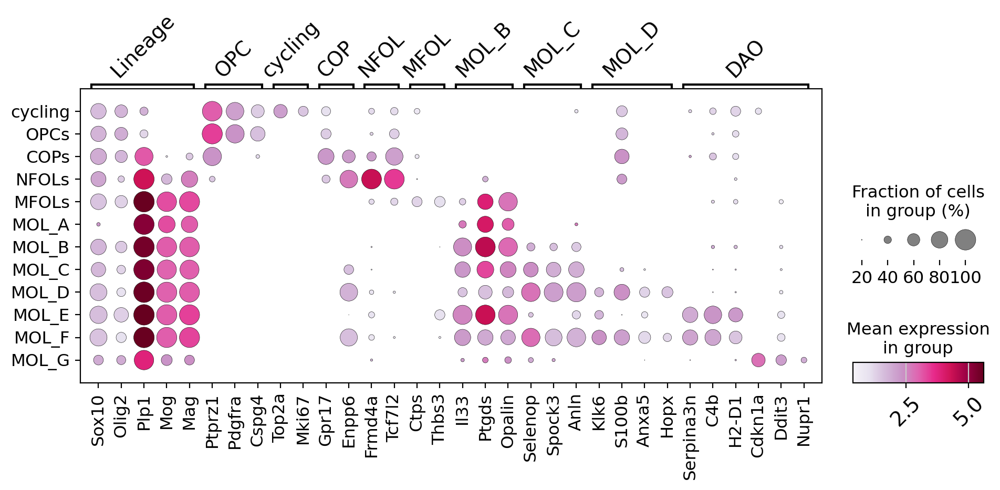

In [42]:
marker_genes = {
    'Lineage': ['Sox10', 'Olig2', 'Plp1', 'Mog', 'Mag'],
    'OPC': ['Ptprz1', 'Pdgfra', 'Cspg4'],
    'cycling': ['Top2a', 'Mki67'],
    'COP': ['Gpr17', 'Enpp6',],
    'NFOL': ['Frmd4a', 'Tcf7l2'],
    'MFOL': ['Ctps', 'Thbs3'],
    'MOL_B': ['Il33', 'Ptgds', 'Opalin'],
    'MOL_C': ['Selenop', 'Spock3', 'Anln'],
    'MOL_D': ['Klk6', 'S100b', 'Anxa5', 'Hopx'],
    'DAO': ['Serpina3n', 'C4b', 'H2-D1', 'Cdkn1a', 'Ddit3', 'Nupr1'],
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes.values() for gene in genes]

# Correct var_group_positions based on marker_genes
var_group_positions = []
start = 0
for genes in marker_genes.values():
    end = start + len(genes) - 1  # Calculate the end index for the group
    var_group_positions.append((start, end))  # Add the start and end index to var_group_positions
    start = end + 1  # Update the start index for the next group

# Plot the dotplot with the corrected parameters
ax = sc.pl.dotplot(
    adata,
    groupby="OL_noDAO_NEW",
    var_names=all_genes,
    use_raw=False,
    log=False,
    dendrogram=False,
    layer='log1p_norm',
    var_group_positions=var_group_positions,
    var_group_labels=list(marker_genes.keys()),
    var_group_rotation=45,
    swap_axes=False,  # Keep genes on the x-axis and cell types on the y-axis
    cmap='PuRd',  # Choose a color map for dot intensities
    color_map='PuRd',  # Choose a color map for dot colors
    figsize=(10, 8),  # Set the figure size
    show=False,
    dot_min=0.19,  # Adjust the minimum dot size
    dot_max=1,  # Adjust the maximum dot size
    mean_only_expressed=True,
    #expression_cutoff=1,
)

# Get the current Axes instance
ax = plt.gca()

# Set the font size and rotation angle for the x-axis (gene labels)
plt.setp(ax.get_xticklabels(), fontsize=14, rotation=45)

# Set the font size for the y-axis (cell type labels)
ax.set_ylabel(ax.get_ylabel(), fontsize=16)

# Set the font size for the x-axis (gene labels)
ax.set_xlabel(ax.get_xlabel(), fontsize=16)

# Adjust spacing between y-axis ticks
plt.subplots_adjust(left=0.1)  # Adjust left margin to reduce space between y-axis ticks and the plot
#plt.subplots_adjust(bottom=0.5) 
plt.subplots_adjust(top=0.5) 

# Save the plot
plt.savefig('./figures/dot_plot_OL_types_NEW2.png')

# Show the plot
plt.show()

In [17]:
LPC_baseline = sc.pp.subsample(adata[adata.obs['lesion_status']=='LPC_baseline'],n_obs=2407,copy=True).obs_names
LPC_demyel = sc.pp.subsample(adata[adata.obs['lesion_status']=='LPC_demyel'],n_obs=2407,copy=True).obs_names
LPC_remyel = sc.pp.subsample(adata[adata.obs['lesion_status']=='LPC_remyel'],n_obs=2407,copy=True).obs_names

Cupr_baseline = sc.pp.subsample(adata[adata.obs['lesion_status']=='Cupr_baseline'],n_obs=2407,copy=True).obs_names
Cupr_demyel = sc.pp.subsample(adata[adata.obs['lesion_status']=='Cupr_demyel'],n_obs=2407,copy=True).obs_names
Cupr_remyel = sc.pp.subsample(adata[adata.obs['lesion_status']=='Cupr_remyel'],n_obs=2407,copy=True).obs_names

adata_all_subsample = adata[list(LPC_baseline) + list(LPC_demyel)+list(LPC_remyel)
                                +list(Cupr_baseline)+list(Cupr_demyel)+list(Cupr_remyel)].copy()

In [18]:
sc.tl.embedding_density(adata_all_subsample, basis='umap', groupby='lesion_status')

computing density on 'umap'
--> added
    'umap_density_lesion_status', densities (adata.obs)
    'umap_density_lesion_status_params', parameter (adata.uns)


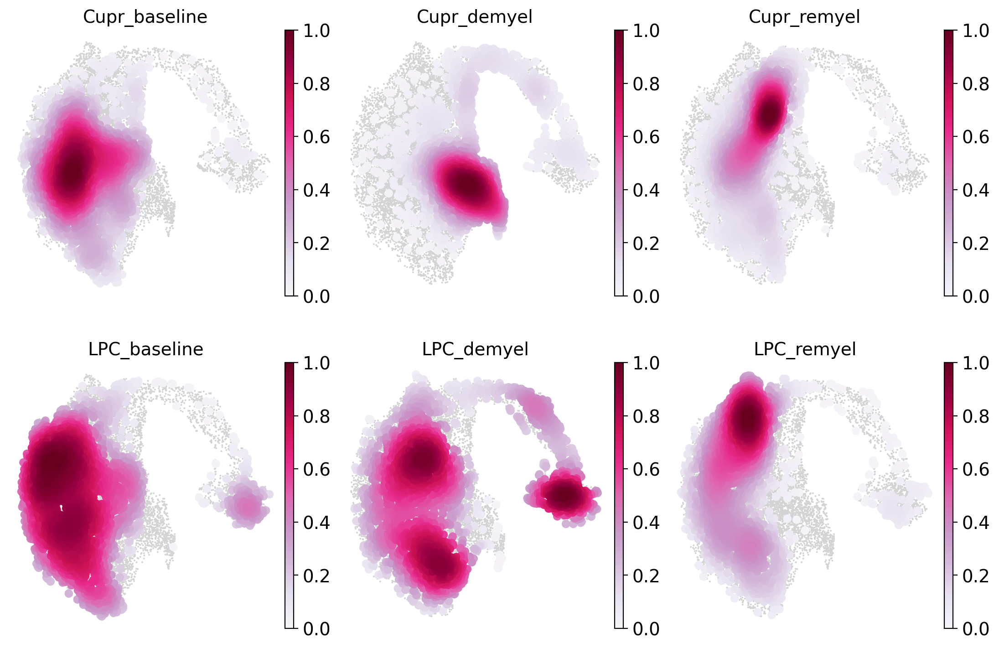

In [19]:
sc.pl.embedding_density(adata_all_subsample, basis='umap',  key='umap_density_lesion_status', color_map='PuRd', wspace=0.1, bg_dotsize = 8, frameon= False, 
                        ncols=3, save=today+'_distribution_downscaling_all.png')

In [9]:
LPC_baseline = sc.pp.subsample(adata[adata.obs['lesion_status']=='LPC_baseline'],n_obs=1000,copy=True).obs_names
LPC_demyel = sc.pp.subsample(adata[adata.obs['lesion_status']=='LPC_demyel'],n_obs=1000,copy=True).obs_names
LPC_remyel = sc.pp.subsample(adata[adata.obs['lesion_status']=='LPC_remyel'],n_obs=1000,copy=True).obs_names

Cupr_baseline = sc.pp.subsample(adata[adata.obs['lesion_status']=='Cupr_baseline'],n_obs=1000,copy=True).obs_names
Cupr_demyel = sc.pp.subsample(adata[adata.obs['lesion_status']=='Cupr_demyel'],n_obs=1000,copy=True).obs_names
Cupr_remyel = sc.pp.subsample(adata[adata.obs['lesion_status']=='Cupr_remyel'],n_obs=1000,copy=True).obs_names

adata_all_subsample = adata[list(LPC_baseline) + list(LPC_demyel)+list(LPC_remyel)
                                +list(Cupr_baseline)+list(Cupr_demyel)+list(Cupr_remyel)].copy()

In [10]:
sc.tl.embedding_density(adata_all_subsample, basis='umap', groupby='lesion_status')

computing density on 'umap'
--> added
    'umap_density_lesion_status', densities (adata.obs)
    'umap_density_lesion_status_params', parameter (adata.uns)


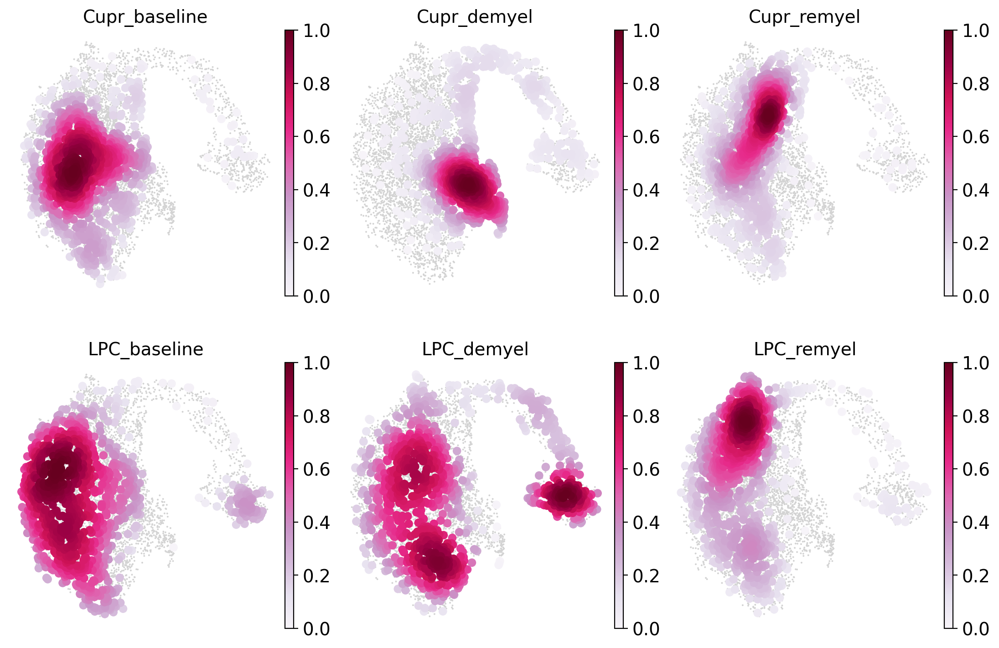

In [12]:
sc.pl.embedding_density(adata_all_subsample, basis='umap',  key='umap_density_lesion_status', color_map='PuRd', wspace=0.1, bg_dotsize = 8, frameon= False, 
                        ncols=3, save='_distribution_downscaling_all_n1000cells.png')

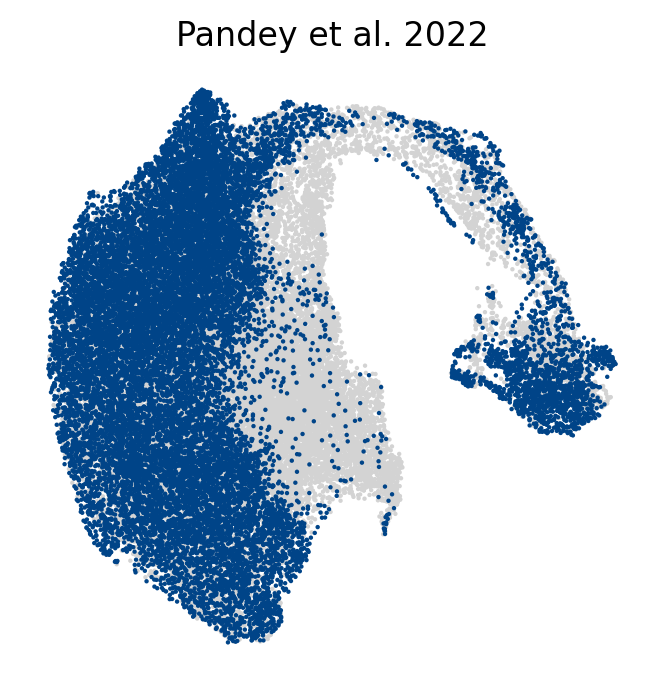

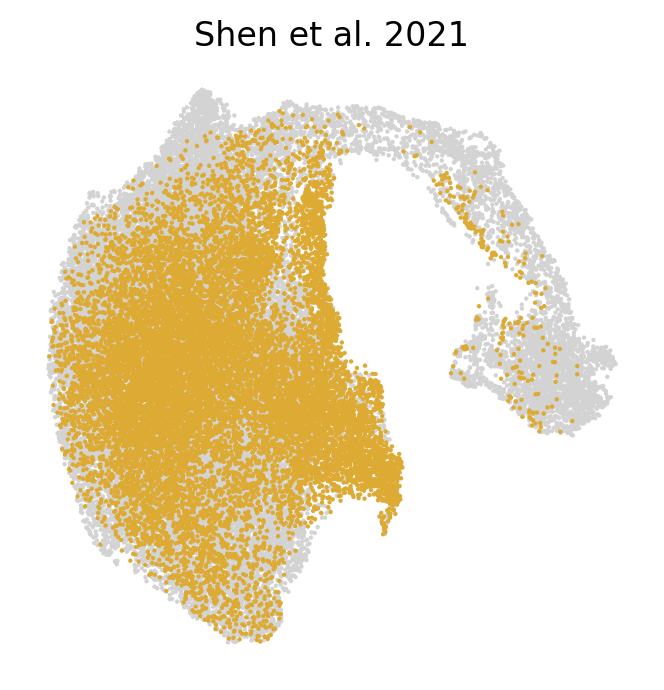

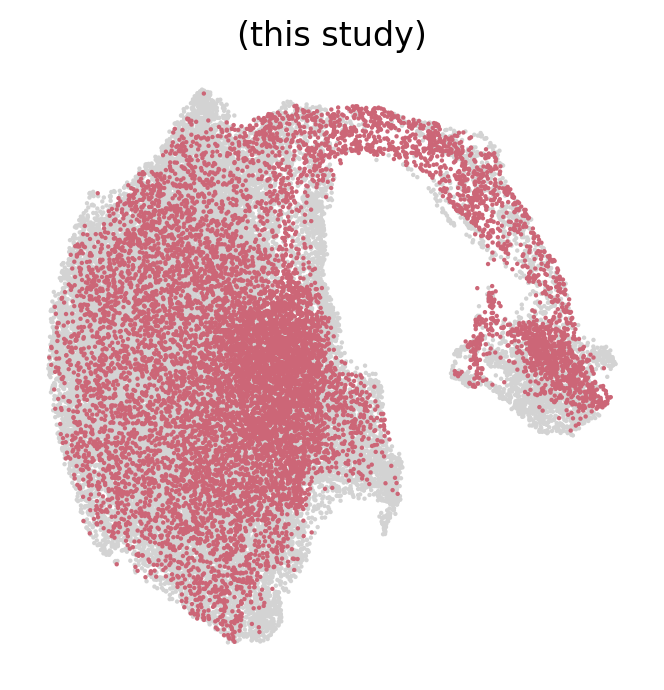

In [6]:
# Define custom colors for the publications
publication_colors = {
    '(this study)': '#CC6677',  # Light pink for the first publication
    'Pandey et al. 2022': '#004488',  # Light blue for the second publication
    'Shen et al. 2021': '#DDAA33'   # Light green for the third publication
}

# Plot UMAP for each publication with custom colors
for i in set(adata.obs['publication']):
    sc.pl.umap(
        adata, 
        color='publication', 
        legend_fontweight='normal', 
        s=10,
        frameon=False, 
        groups=[i], 
        palette=publication_colors,
        title=i,  # Set the title to the publication name
        legend_loc=None,  # Turn off the legend
        save=i+'_publication.png'
    )

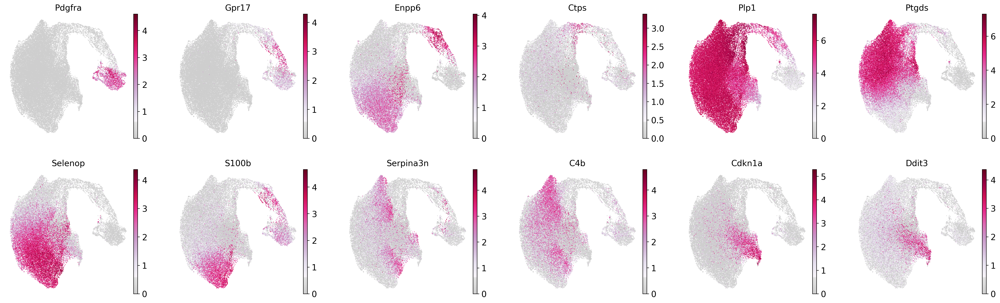

In [65]:
from matplotlib import rcParams
from matplotlib import cm, colors

# Create a custom color map using 'PuRd' color map
colors2 = plt.cm.PuRd(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

genes = ['Pdgfra','Gpr17', 'Enpp6', 'Ctps', 
         'Plp1', 'Ptgds', 'Selenop', 'S100b',
         'Serpina3n', 'C4b',
         'Cdkn1a', 'Ddit3']

sc.pl.umap(adata, color=genes, 
           use_raw=False, color_map=mymap, s=5, ncols=6, frameon=False, legend_loc='on data',
          save=today+'gene_expression_umaps_PSOTER.pdf')

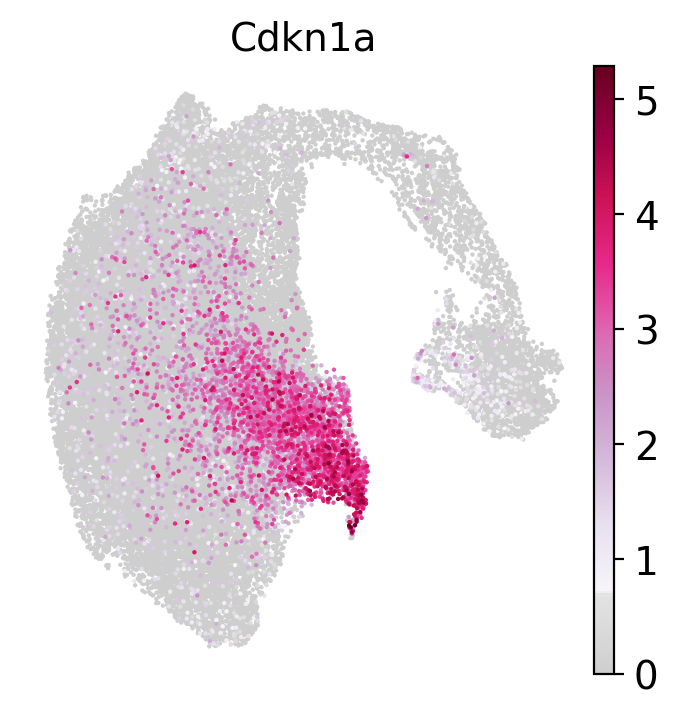

In [14]:
from matplotlib import rcParams
from matplotlib import cm, colors

# Create a custom color map using 'PuRd' color map
colors2 = plt.cm.PuRd(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

genes = ['Cdkn1a']

sc.pl.umap(adata, color=genes, 
           use_raw=False, color_map=mymap, s=10, ncols=6, frameon=False, legend_loc='on data',
          save=today+'Cdkn1a.png')

In [24]:
cluster2annotation = {
    '0': '0_MOL_C',
    '1': '1_MOL_B',
    '2': '2_MOL_C',
    '3': '3_MOL_B',
    '4': '4_MOL_G',
    '5': '5_MOL_A',
    '6': '6_MOL_E',
    '7': '7_OPCs',
    '8': '8_MOL_E',
    '9': '9_MOL_C',
    '10': '10_MOL_C',
    '11': '11_MOL_B',
    '12': '12_MOL_D',
    '13': '13_MOL_G',
    '14': '14_MOL_F',
    '15': '15_MOL_B',
    '16': '16_MOL_C',
    '17': '17_MOL_B',
    '18': '18_MFOLs',
    '19': '19_MOL_C',
    '20': '20_MOL_B',
    '21': '21_MOL_B',
    '22': '22_NFOLs',
    '23': '23_MOL_A',
    '24': '24_COPs',
    '25': '25_MOL_F',
    '26': '26_MOL_B',
    '27': '27_cycling',
}

adata.obs['OL_leiden_annotated'] = adata.obs['leiden_OL_r1.5'].map(cluster2annotation).astype('category')

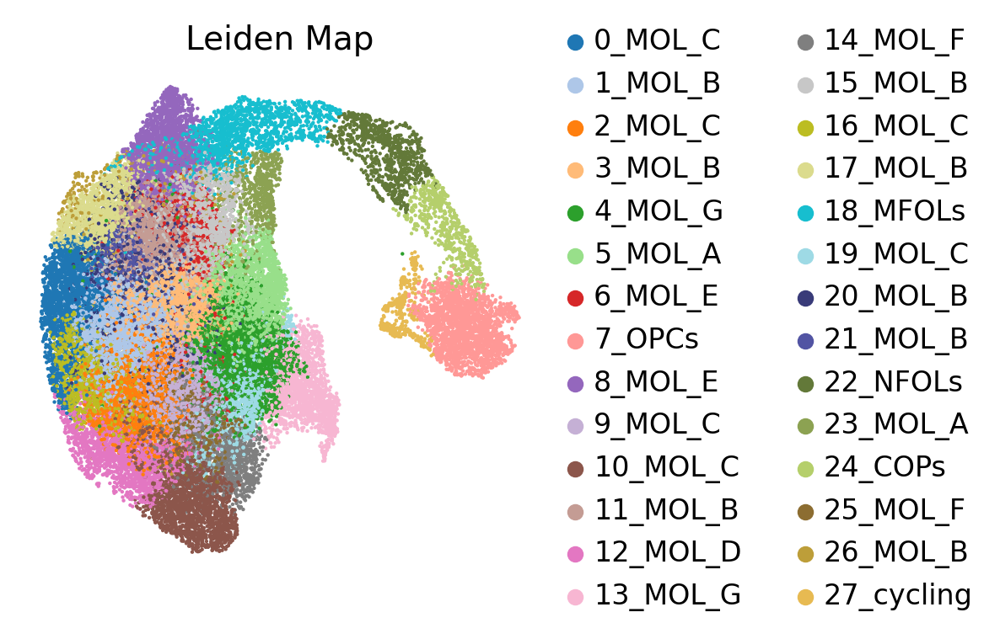

In [27]:
cluster_color = {
    '0_MOL_C': '#1f77b4',       # Blue for MOL_C (0)
    '1_MOL_B': '#aec7e8',       # Light Blue for MOL_B (1)
    '2_MOL_C': '#ff7f0e',       # Light Orange for MOL_C (2)
    '3_MOL_B': '#ffbb78',       # Light Orange for MOL_B (3)
    '4_MOL_G': '#2ca02c',       # Green for MOL_G (4)
    '5_MOL_A': '#98df8a',       # Light Green for MOL_A (5)
    '6_MOL_E': '#d62728',       # Light Brown for MOL_E (6)
    '7_OPCs': '#ff9896',        # Light Teal for OPCs (7)
    '8_MOL_E': '#9467bd',       # Purple for MOL_E (8)
    '9_MOL_C': '#c5b0d5',       # Light Purple for MOL_C (9)
    '10_MOL_C': '#8c564b',      # Brown for MOL_C (10)
    '11_MOL_B': '#c49c94',      # Light Brown for MOL_B (11)
    '12_MOL_D': '#e377c2',      # Pink for MOL_D (12)
    '13_MOL_G': '#f7b6d2',      # Light Pink for MOL_G (13)
    '14_MOL_F': '#7f7f7f',      # Gray for MOL_F (14)
    '15_MOL_B': '#c7c7c7',      # Light Gray for MOL_B (15)
    '16_MOL_C': '#bcbd22',      # Olive for MOL_C (16)
    '17_MOL_B': '#dbdb8d',      # Light Olive for MOL_B (17)
    '18_MFOLs': '#17becf',      # Teal for MFOLs (18)
    '19_MOL_C': '#9edae5',      # Light Teal for MOL_C (19)
    '20_MOL_B': '#393b79',      # Dark Blue for MOL_B (20)
    '21_MOL_B': '#5254a3',      # Indigo for MOL_B (21)
    '22_NFOLs': '#637939',      # Olive for NFOLs (22)
    '23_MOL_A': '#8ca252',      # Moss Green for MOL_A (23)
    '24_COPs': '#b5cf6b',       # Light Moss Green for COPs (24)
    '25_MOL_F': '#8c6d31',      # Tan for MOL_F (25)
    '26_MOL_B': '#bd9e39',      # Golden Brown for MOL_B (26)
    '27_cycling': '#e7ba52',    # Orange for cycling OPCs (27)
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['OL_leiden_annotated'], legend_fontsize =float(12) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color, s=10,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, 
           title='Leiden Map', save=today+'_leiden_map_annotated_MMsysVI_OL.png' )

In [52]:
adata.write_h5ad('/scratch365/eaboelno/BACKUP_h5ad_IMPORTANT/adata_mm_OL_NEW.h5ad')
adata

AnnData object with n_obs × n_vars = 44794 × 19913
    obs: 'sample_id', 'publication', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'type_fine', 'type_broad', 'indiv_treatment_time', 'lesion_status', 'lesion_condition', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'S_score', 'G2M_score', 'Cycling cells', 'S phase', 'Cycling_cells', 'S_phase_cells', 'leiden_OL_r1.5', 'individual_lesion_condition', 'OL_broad', 'OL_broad_MOLs', 'OL_leiden_annotated_new', 'minimal_treatment_map', 'OL_fine_type', 'OL_leiden_annotated', 'cell_type', 'OL_fine_type_NEW', 'OL_noDAO_NEW', 'OL_noDAO_NEW_NUMBERED', 'OL_noDAO_NUMBERED', 'OL_noDAO_LETTER'
    var: 'hb', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'OL_broad_MOLs_colors', 'OL_broad_MOLs_sizes', 'OL_broad_colors', 'OL_broad_sizes', 'O